<h3 style="color:#FFD866; border-left:5px solid #FFD866; padding-left:12px;">
1. Drive 연결
</h3>

In [31]:
from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<h3 style="color:#FFD866; border-left:5px solid #FFD866; padding-left:12px;">
2. Ultralytics 설치
</h3>

In [32]:
%pip install -q -U ultralytics

<h3 style="color:#FFD866; border-left:5px solid #FFD866; padding-left:12px;">
3. 경로 설정
</h3>

In [33]:
from pathlib import Path

# Google Drive 프로젝트 루트
DRIVE_ROOT = Path(
    "/content/drive/MyDrive/AI_Project/wardy/ml/src"
)

# Colab 작업 공간
WORK_ROOT = Path("/content")

# 기존 V2 데이터셋
V2_DATASET_ZIP = (
    DRIVE_ROOT
    / "data/hazard_objects_v2.zip"
)

# 이번에 만든 C270 추가 데이터
ADDITIONAL_ZIP = (
    DRIVE_ROOT
    / "data/hazard_objects_v2_webcam_additional_corrected.zip"
)

# 현재 최종 모델 V2 best.pt
BEST_V2 = (
    DRIVE_ROOT
    / "export/hazard_objects_v2_finetune_v2/weights/best.pt"
)

# C270 Fine-tune v1 데이터셋
V2_ROOT = WORK_ROOT / "hazard_objects_v2"
C270_DATASET_ROOT = WORK_ROOT / "hazard_objects_c270_v1"

# 학습 결과 저장 위치
EXPORT_DIR = DRIVE_ROOT / "export"
RUN_NAME = "hazard_objects_c270_finetune_v1"
RUN_DIR = EXPORT_DIR / RUN_NAME

print("V2 dataset zip :", V2_DATASET_ZIP.exists())
print("Webcam zip     :", ADDITIONAL_ZIP.exists())
print("V2 best.pt     :", BEST_V2.exists())

V2 dataset zip : True
Webcam zip     : True
V2 best.pt     : True


<h3 style="color:#FFD866; border-left:5px solid #FFD866; padding-left:12px;">
4. V2 데이터셋 압축 해제
</h3>

In [34]:
import shutil

if V2_ROOT.exists():
    shutil.rmtree(V2_ROOT)

shutil.unpack_archive(
    str(V2_DATASET_ZIP),
    str(WORK_ROOT)
)

print("dataset:", V2_ROOT)
print("존재:", V2_ROOT.exists())

dataset: /content/hazard_objects_v2
존재: True


<h3 style="color:#FFD866; border-left:5px solid #FFD866; padding-left:12px;">
5. V2 데이터 개수 확인
</h3>

In [35]:
IMAGE_EXTS = {".jpg", ".jpeg", ".png", ".webp"}

for split in ["train", "val", "test"]:
    image_dir = V2_ROOT / "images" / split
    label_dir = V2_ROOT / "labels" / split

    images = [
        p for p in image_dir.iterdir()
        if p.suffix.lower() in IMAGE_EXTS
    ]

    labels = list(label_dir.glob("*.txt"))

    print(
        f"{split:5s} | "
        f"images: {len(images):5d} | "
        f"labels: {len(labels):5d}"
    )

train | images:  5527 | labels:  5527
val   | images:   686 | labels:   686
test  | images:   569 | labels:   569


<h3 style="color:#FFD866; border-left:5px solid #FFD866; padding-left:12px;">
6. C270 추가 데이터 압축 해제
</h3>

In [36]:
ADDITIONAL_EXTRACT_ROOT = WORK_ROOT / "webcam_additional"

if ADDITIONAL_EXTRACT_ROOT.exists():
    shutil.rmtree(ADDITIONAL_EXTRACT_ROOT)

ADDITIONAL_EXTRACT_ROOT.mkdir(parents=True)

shutil.unpack_archive(
    str(ADDITIONAL_ZIP),
    str(ADDITIONAL_EXTRACT_ROOT)
)

image_dirs = [
    p for p in ADDITIONAL_EXTRACT_ROOT.rglob("images")
    if p.is_dir()
]

label_dirs = [
    p for p in ADDITIONAL_EXTRACT_ROOT.rglob("labels")
    if p.is_dir()
]

if len(image_dirs) != 1 or len(label_dirs) != 1:
    raise RuntimeError(
        f"images/labels 폴더 확인 필요: "
        f"images={image_dirs}, labels={label_dirs}"
    )

ADD_IMAGES = image_dirs[0]
ADD_LABELS = label_dirs[0]

print("images:", ADD_IMAGES)
print("labels:", ADD_LABELS)

images: /content/webcam_additional/hazard_objects_v2_webcam_additional/images
labels: /content/webcam_additional/hazard_objects_v2_webcam_additional/labels


<h3 style="color:#FFD866; border-left:5px solid #FFD866; padding-left:12px;">
7. C270 추가 데이터 검증
</h3>

In [37]:
additional_images = sorted([
    p for p in ADD_IMAGES.iterdir()
    if p.suffix.lower() in IMAGE_EXTS
])

missing_labels = []
empty_labels = []
class_box_counts = {0: 0, 1: 0, 2: 0, 3: 0}
invalid_labels = []

for image_path in additional_images:
    label_path = ADD_LABELS / f"{image_path.stem}.txt"

    if not label_path.exists():
        missing_labels.append(image_path.name)
        continue

    text = label_path.read_text(encoding="utf-8").strip()

    if not text:
        empty_labels.append(label_path.name)
        continue

    for line in text.splitlines():
        parts = line.split()

        if len(parts) != 5:
            invalid_labels.append((label_path.name, line))
            continue

        class_id = int(parts[0])

        if class_id not in class_box_counts:
            invalid_labels.append((label_path.name, line))
            continue

        class_box_counts[class_id] += 1

print("총 이미지        :", len(additional_images))
print("Negative(빈 라벨):", len(empty_labels))
print("bbox 클래스 수   :", class_box_counts)
print("라벨 누락        :", len(missing_labels))
print("잘못된 라벨      :", len(invalid_labels))

if missing_labels:
    print("누락 예시:", missing_labels[:5])

if invalid_labels:
    print("오류 예시:", invalid_labels[:5])

if missing_labels or invalid_labels:
    raise RuntimeError("추가 데이터 라벨을 다시 확인하세요.")

if class_box_counts[1] != 0 or class_box_counts[3] != 0:
    raise RuntimeError(
        "추가 데이터에는 scissors(0), cutter(2), Negative만 있어야 합니다."
    )

총 이미지        : 102
Negative(빈 라벨): 34
bbox 클래스 수   : {0: 38, 1: 0, 2: 30, 3: 0}
라벨 누락        : 0
잘못된 라벨      : 0


<h3 style="color:#FFD866; border-left:5px solid #FFD866; padding-left:12px;">
8. C270 Fine-tune v1 데이터셋 생성
</h3>

In [38]:
if C270_DATASET_ROOT.exists():
    shutil.rmtree(C270_DATASET_ROOT)

shutil.copytree(
    V2_ROOT,
    C270_DATASET_ROOT
)

print("C270 Fine-tune v1 데이터셋 생성 완료")
print(C270_DATASET_ROOT)

C270 Fine-tune v1 데이터셋 생성 완료
/content/hazard_objects_c270_v1


<h3 style="color:#FFD866; border-left:5px solid #FFD866; padding-left:12px;">
9. C270 데이터 Train / Val 분할
</h3>

In [39]:
import random

SEED = 42
VAL_RATIO = 0.2

groups = {
    "scissors": [],
    "cutter": [],
    "negative": [],
}

for image_path in additional_images:
    label_path = ADD_LABELS / f"{image_path.stem}.txt"
    text = label_path.read_text(encoding="utf-8").strip()

    if not text:
        groups["negative"].append(image_path)
        continue

    class_ids = {
        int(line.split()[0])
        for line in text.splitlines()
        if line.strip()
    }

    if class_ids == {0}:
        groups["scissors"].append(image_path)

    elif class_ids == {2}:
        groups["cutter"].append(image_path)

    else:
        raise RuntimeError(
            f"예상하지 못한 클래스 조합: "
            f"{image_path.name} -> {class_ids}"
        )

rng = random.Random(SEED)

train_files = []
val_files = []

for group_name, files in groups.items():
    files = files.copy()
    rng.shuffle(files)

    val_count = max(1, round(len(files) * VAL_RATIO))

    val_group = files[:val_count]
    train_group = files[val_count:]

    train_files.extend(train_group)
    val_files.extend(val_group)

    print(
        f"{group_name:10s} | "
        f"전체 {len(files):3d} | "
        f"train {len(train_group):3d} | "
        f"val {len(val_group):3d}"
    )

rng.shuffle(train_files)
rng.shuffle(val_files)

print()
print("Train 추가:", len(train_files))
print("Val 추가  :", len(val_files))
print("합계      :", len(train_files) + len(val_files))

scissors   | 전체  38 | train  30 | val   8
cutter     | 전체  30 | train  24 | val   6
negative   | 전체  34 | train  27 | val   7

Train 추가: 81
Val 추가  : 21
합계      : 102


<h3 style="color:#FFD866; border-left:5px solid #FFD866; padding-left:12px;">
10. C270 데이터를 C270 Fine-tune v1 데이터셋에 추가
</h3>

In [40]:
def copy_webcam_data(files, split):
    dst_images = C270_DATASET_ROOT / "images" / split
    dst_labels = C270_DATASET_ROOT / "labels" / split

    copied = 0

    for image_path in files:
        label_path = ADD_LABELS / f"{image_path.stem}.txt"

        new_image_name = f"webcam_{image_path.name}"
        new_label_name = f"webcam_{image_path.stem}.txt"

        shutil.copy2(
            image_path,
            dst_images / new_image_name
        )

        shutil.copy2(
            label_path,
            dst_labels / new_label_name
        )

        copied += 1

    return copied


train_added = copy_webcam_data(
    train_files,
    "train"
)

val_added = copy_webcam_data(
    val_files,
    "val"
)

print("Train 추가:", train_added)
print("Val 추가  :", val_added)

Train 추가: 81
Val 추가  : 21


<h3 style="color:#FFD866; border-left:5px solid #FFD866; padding-left:12px;">
11. C270 Fine-tune v1 데이터 개수 확인
</h3>

In [41]:
for split in ["train", "val", "test"]:
    image_dir = C270_DATASET_ROOT / "images" / split
    label_dir = C270_DATASET_ROOT / "labels" / split

    images = [
        p for p in image_dir.iterdir()
        if p.suffix.lower() in IMAGE_EXTS
    ]

    labels = list(label_dir.glob("*.txt"))

    print(
        f"{split:5s} | "
        f"images: {len(images):5d} | "
        f"labels: {len(labels):5d}"
    )

train | images:  5608 | labels:  5608
val   | images:   707 | labels:   707
test  | images:   569 | labels:   569


<h3 style="color:#FFD866; border-left:5px solid #FFD866; padding-left:12px;">
12. C270 Fine-tune v1 data.yaml 생성
</h3>

In [42]:
DATA_YAML = C270_DATASET_ROOT / "data.yaml"

yaml_text = f"""
path: {C270_DATASET_ROOT}

train: images/train
val: images/val
test: images/test

names:
  0: scissors
  1: knife
  2: cutter
  3: syringe
"""

DATA_YAML.write_text(
    yaml_text.strip(),
    encoding="utf-8"
)

print(DATA_YAML.read_text())

path: /content/hazard_objects_c270_v1

train: images/train
val: images/val
test: images/test

names:
  0: scissors
  1: knife
  2: cutter
  3: syringe


<h3 style="color:#FFD866; border-left:5px solid #FFD866; padding-left:12px;">
13. C270 Fine-tune v1 데이터셋 최종 검증
</h3>

In [43]:
def count_dataset_labels(dataset_root, split):
    label_dir = dataset_root / "labels" / split

    box_counts = {0: 0, 1: 0, 2: 0, 3: 0}
    empty_count = 0

    for label_path in label_dir.glob("*.txt"):
        text = label_path.read_text(
            encoding="utf-8"
        ).strip()

        if not text:
            empty_count += 1
            continue

        for line in text.splitlines():
            class_id = int(line.split()[0])
            box_counts[class_id] += 1

    return box_counts, empty_count


for split in ["train", "val", "test"]:
    box_counts, empty_count = count_dataset_labels(
        C270_DATASET_ROOT,
        split
    )

    print(f"[{split}]")
    print("bbox     :", box_counts)
    print("Negative :", empty_count)
    print()

[train]
bbox     : {0: 2104, 1: 2173, 2: 1319, 3: 1150}
Negative : 119

[val]
bbox     : {0: 264, 1: 269, 2: 158, 3: 147}
Negative : 30

[test]
bbox     : {0: 253, 1: 166, 2: 172, 3: 137}
Negative : 0



<h3 style="color:#FFD866; border-left:5px solid #FFD866; padding-left:12px;">
14. V2 Best Model 불러오기
</h3>

In [44]:
from ultralytics import YOLO

model_v2 = YOLO(str(BEST_V2))

print("best.pt 존재:", BEST_V2.exists())
print("경로:", BEST_V2)
print("classes:", model_v2.names)

best.pt 존재: True
경로: /content/drive/MyDrive/AI_Project/wardy/ml/src/export/hazard_objects_v2_finetune_v2/weights/best.pt
classes: {0: 'scissors', 1: 'knife', 2: 'cutter', 3: 'syringe'}


<h3 style="color:#FFD866; border-left:5px solid #FFD866; padding-left:12px;">
15. C270 데이터 추가 파인튜닝
</h3>

In [ ]:
model_c270 = YOLO(str(BEST_V2))

results_c270 = model_c270.train(
    data=str(DATA_YAML),

    epochs=20,
    imgsz=640,
    batch=16,
    device=0,

    # 이전 실험에서 rotation augmentation이 성능을 떨어뜨렸으므로 사용하지 않음
    degrees=0.0,

    # Validation 성능이 장기간 개선되지 않으면 조기 종료
    patience=10,

    seed=42,

    project=str(EXPORT_DIR),
    name=RUN_NAME,
    exist_ok=True,

    plots=True,
    save=True,
)

<h3 style="color:#FFD866; border-left:5px solid #FFD866; padding-left:12px;">
16. C270 Fine-tune v1 Best Model 불러오기
</h3>

In [45]:
BEST_C270 = RUN_DIR / "weights/best.pt"

print("best.pt 존재:", BEST_C270.exists())
print("경로:", BEST_C270)

model_c270_best = YOLO(str(BEST_C270))

best.pt 존재: True
경로: /content/drive/MyDrive/AI_Project/wardy/ml/src/export/hazard_objects_c270_finetune_v1/weights/best.pt


<h3 style="color:#FFD866; border-left:5px solid #FFD866; padding-left:12px;">
17. 학습 결과 그래프 확인
</h3>

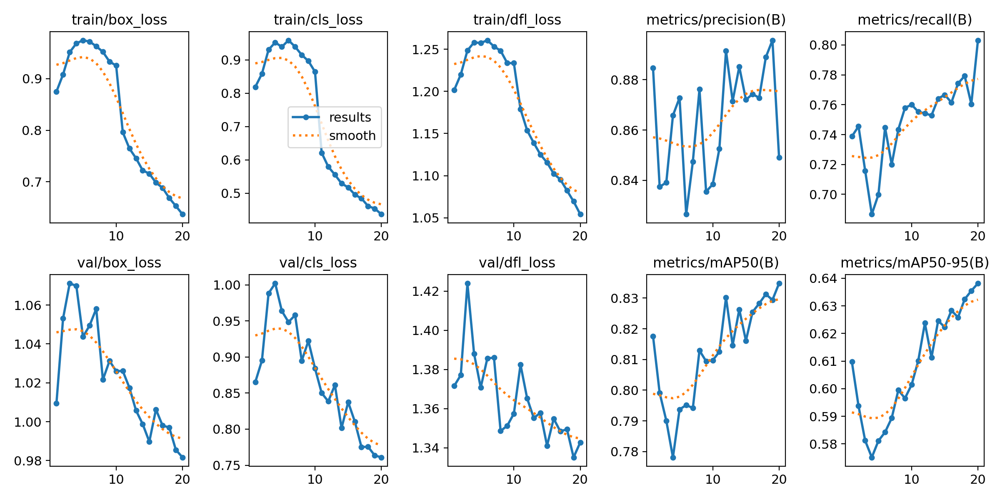

In [46]:
from IPython.display import Image, display

display(
    Image(filename=str(RUN_DIR / "results.png"))
)

<h3 style="color:#FFD866; border-left:5px solid #FFD866; padding-left:12px;">
18. Confusion Matrix 확인
</h3>

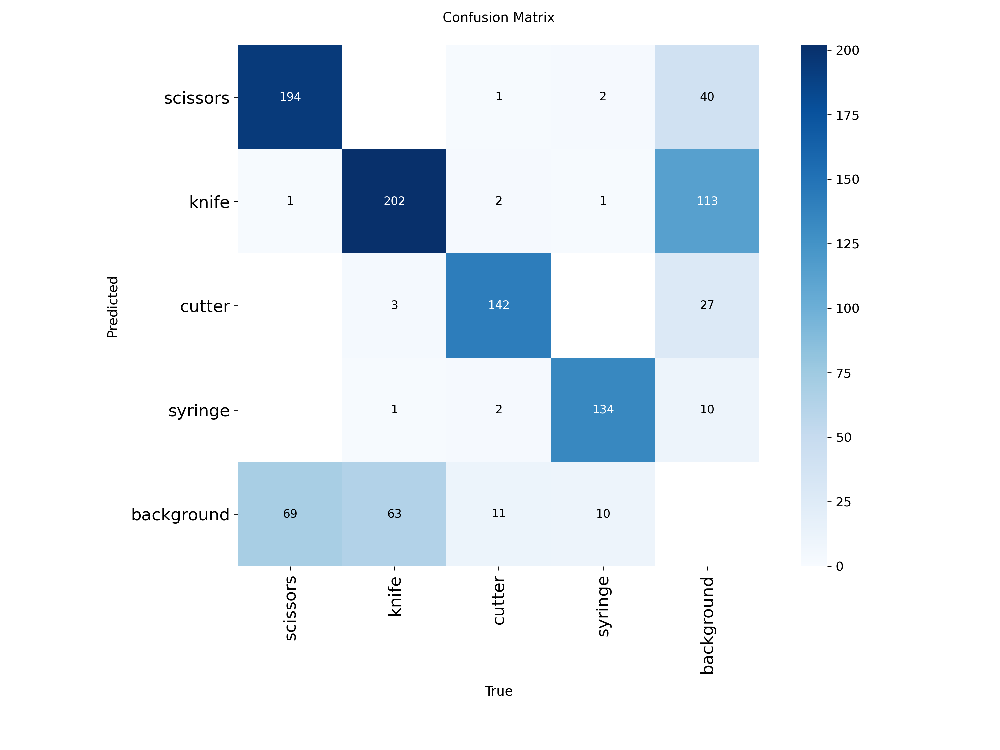

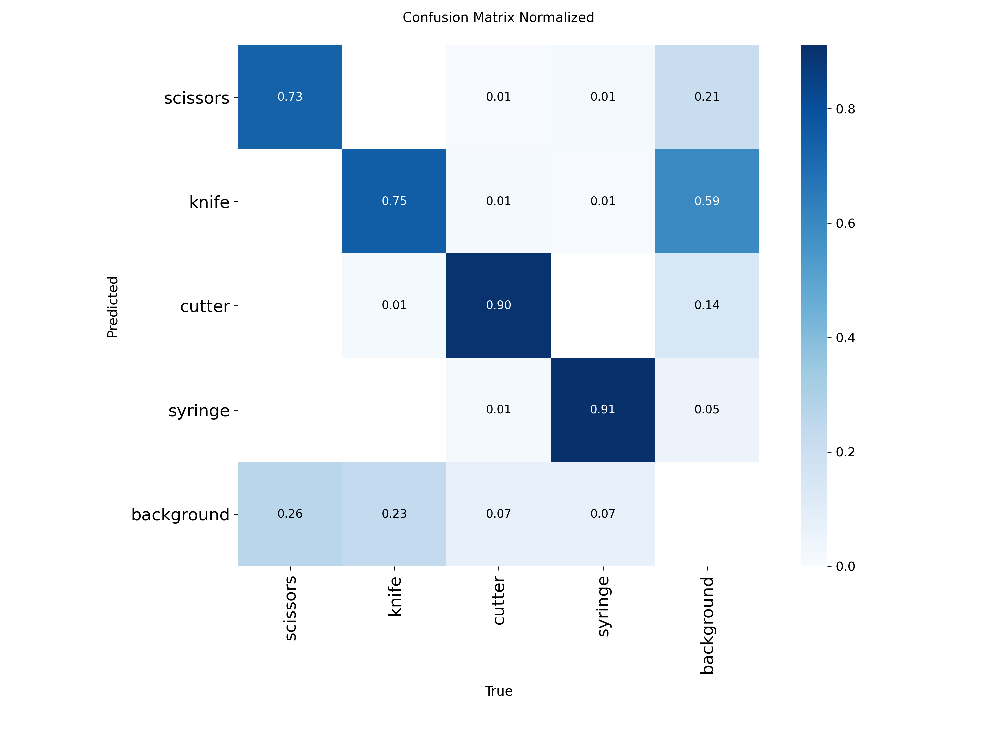

In [47]:
display(
    Image(
        filename=str(
            RUN_DIR / "confusion_matrix.png"
        )
    )
)

display(
    Image(
        filename=str(
            RUN_DIR / "confusion_matrix_normalized.png"
        )
    )
)

<h3 style="color:#FFD866; border-left:5px solid #FFD866; padding-left:12px;">
19. Precision-Recall Curve 확인
</h3>

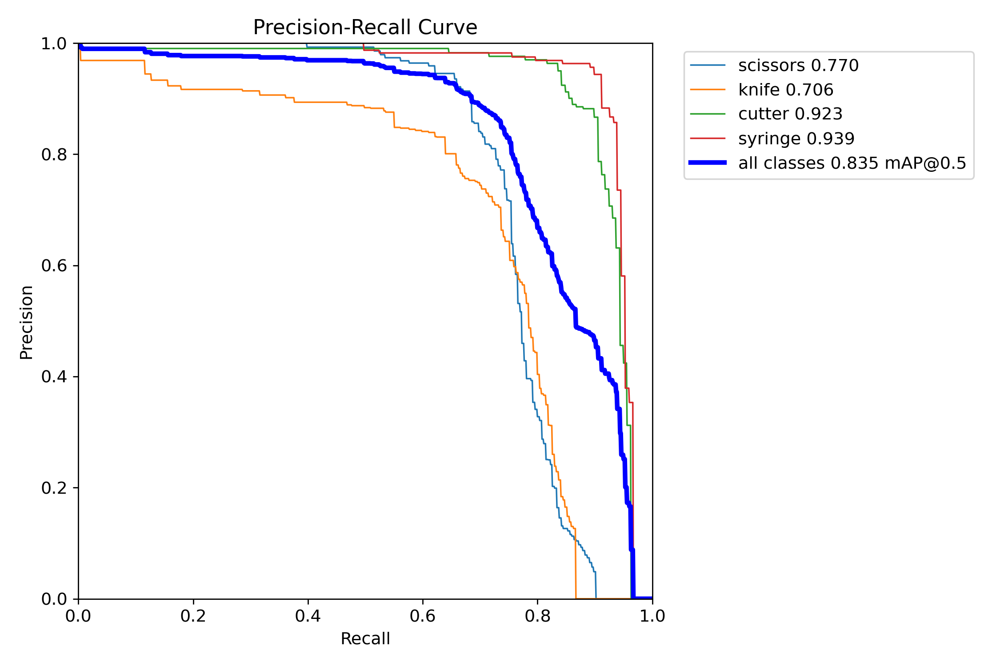

In [48]:
display(
    Image(filename=str(RUN_DIR / "BoxPR_curve.png"))
)

<h3 style="color:#FFD866; border-left:5px solid #FFD866; padding-left:12px;">
20. F1 / Precision / Recall Confidence Curve 확인
</h3>

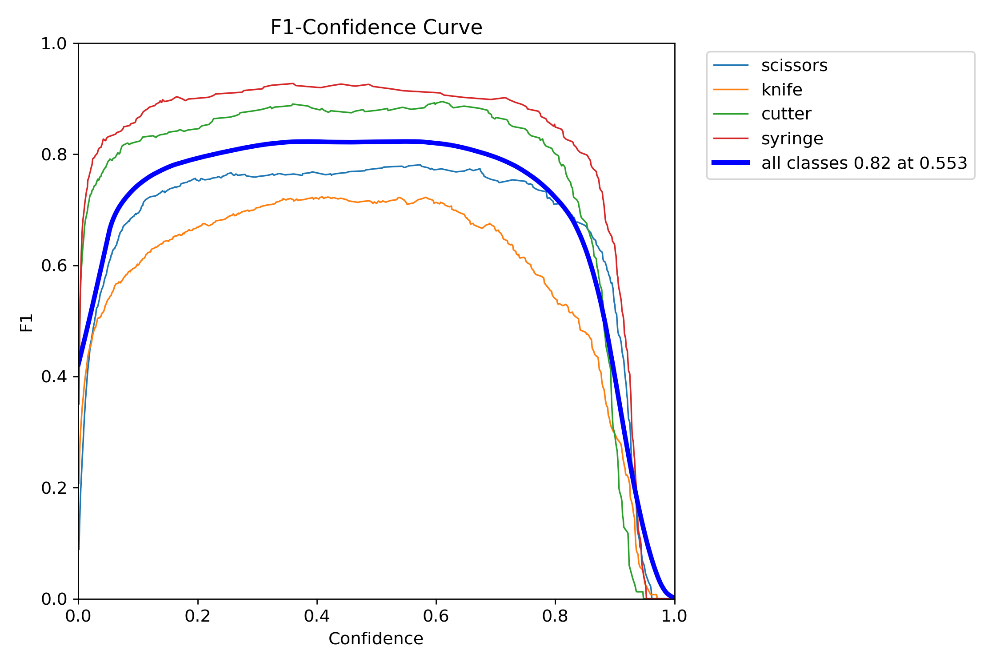

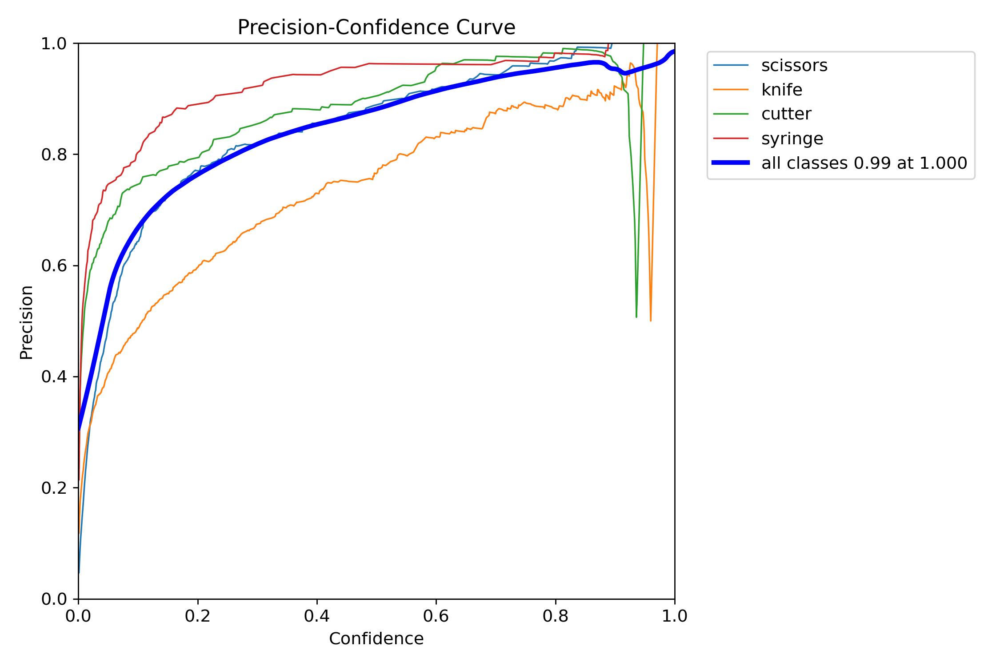

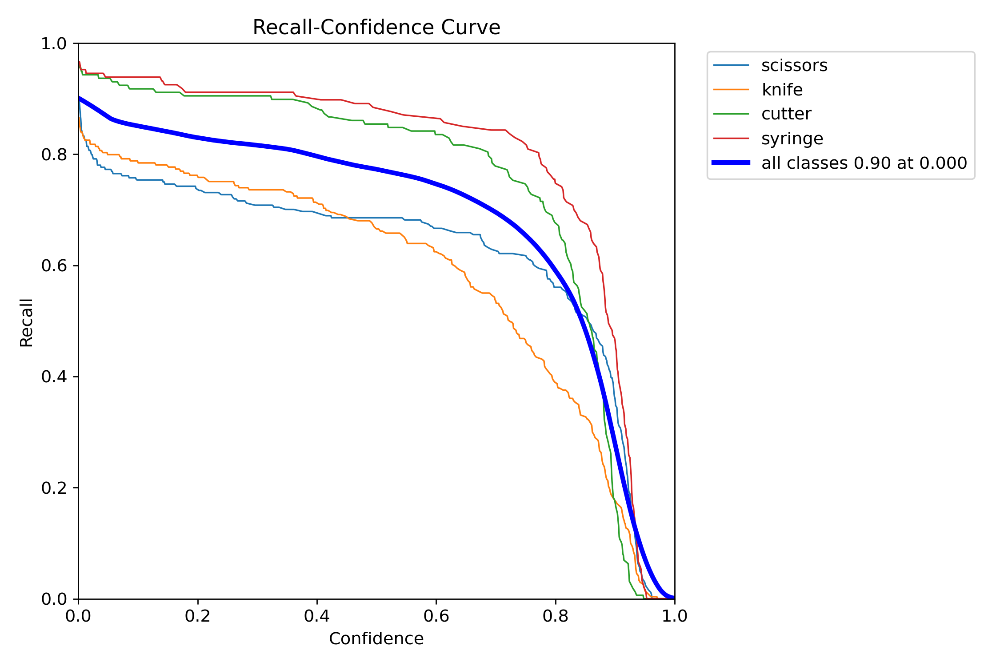

In [49]:
display(
    Image(filename=str(RUN_DIR / "BoxF1_curve.png"))
)

display(
    Image(filename=str(RUN_DIR / "BoxP_curve.png"))
)

display(
    Image(filename=str(RUN_DIR / "BoxR_curve.png"))
)

<h3 style="color:#FFD866; border-left:5px solid #FFD866; padding-left:12px;">
21. C270 Fine-tune v1 기존 Test Dataset 성능 평가
</h3>

In [50]:
metrics_c270 = model_c270_best.val(
    data=str(DATA_YAML),
    split="test",
    imgsz=640,
    device=0,
    plots=True,
)

Ultralytics 8.4.118 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11n summary (fused): 101 layers, 2,582,932 parameters, 0 gradients, 6.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1469.4±736.0 MB/s, size: 63.6 KB)
val: Scanning /content/hazard_objects_c270_v1/labels/test... 569 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 569/569 2.4Kit/s 0.2s0.1ss
val: New cache created: /content/hazard_objects_c270_v1/labels/test.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 36/36 5.1it/s 7.1s0.1s
                   all        569        728      0.814      0.773      0.813      0.606
              scissors        200        253      0.744      0.653      0.717      0.527
                 knife        155        166      0.728      0.663      0.664      0.426
                cutter         94        172      0.877      0.855      0.911      0.668
               syringe        120        137

<h3 style="color:#FFD866; border-left:5px solid #FFD866; padding-left:12px;">
22. C270 Fine-tune v1 Test mAP 결과 확인
</h3>

In [51]:
print(f"mAP50    : {metrics_c270.box.map50:.4f}")
print(f"mAP75    : {metrics_c270.box.map75:.4f}")
print(f"mAP50-95 : {metrics_c270.box.map:.4f}")

mAP50    : 0.8125
mAP75    : 0.6679
mAP50-95 : 0.6060


<h3 style="color:#FFD866; border-left:5px solid #FFD866; padding-left:12px;">
23. C270 Fine-tune v1 클래스별 mAP 확인
</h3>

In [52]:
for class_id, class_map in enumerate(
    metrics_c270.box.maps
):
    class_name = model_c270_best.names[class_id]

    print(
        f"{class_id} {class_name:10s}: "
        f"{class_map:.4f}"
    )

0 scissors  : 0.5273
1 knife     : 0.4255
2 cutter    : 0.6683
3 syringe   : 0.8028


<h3 style="color:#FFD866; border-left:5px solid #FFD866; padding-left:12px;">
24. C270 Fine-tune v1 Confusion Matrix 수치 확인
</h3>

In [53]:
metrics_c270.confusion_matrix.to_df()

Predicted,scissors,knife,cutter,syringe,background
str,f64,f64,f64,f64,f64
"""scissors""",174.0,1.0,0.0,1.0,62.0
"""knife""",2.0,116.0,0.0,0.0,38.0
"""cutter""",0.0,1.0,154.0,0.0,21.0
"""syringe""",0.0,1.0,0.0,127.0,15.0
"""background""",77.0,47.0,18.0,9.0,0.0


<h3 style="color:#FFD866; border-left:5px solid #FFD866; padding-left:12px;">
25. V2 모델 Test 평가
</h3>

In [54]:
metrics_v2 = model_v2.val(
    data=str(DATA_YAML),
    split="test",
    imgsz=640,
    device=0,
    plots=False,
)

Ultralytics 8.4.118 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11n summary (fused): 101 layers, 2,582,932 parameters, 0 gradients, 6.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1126.3±480.5 MB/s, size: 23.8 KB)
val: Scanning /content/hazard_objects_c270_v1/labels/test.cache... 569 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 569/569 238.7Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 36/36 8.7it/s 4.1s0.1s
                   all        569        728      0.834      0.774      0.824      0.615
              scissors        200        253      0.764       0.64      0.711      0.537
                 knife        155        166      0.774      0.669      0.697      0.444
                cutter         94        172       0.89      0.844      0.922      0.669
               syringe        120        137       0.91      0.942      0.967      0.809
Speed: 0.8ms preprocess, 3

<h3 style="color:#FFD866; border-left:5px solid #FFD866; padding-left:12px;">
26. V2 / C270 Fine-tune v1 전체 성능 비교
</h3>

In [55]:
print("========== V2 ==========")
print(f"mAP50    : {metrics_v2.box.map50:.4f}")
print(f"mAP50-95 : {metrics_v2.box.map:.4f}")

print()

print("===== C270 Fine-tune v1 =====")
print(f"mAP50    : {metrics_c270.box.map50:.4f}")
print(f"mAP50-95 : {metrics_c270.box.map:.4f}")

print()

print("========== 변화 ==========")
print(
    f"mAP50    : "
    f"{metrics_c270.box.map50 - metrics_v2.box.map50:+.4f}"
)
print(
    f"mAP50-95 : "
    f"{metrics_c270.box.map - metrics_v2.box.map:+.4f}"
)

========== V2 ==========
mAP50    : 0.8243
mAP50-95 : 0.6150

===== C270 Fine-tune v1 =====
mAP50    : 0.8125
mAP50-95 : 0.6060

========== 변화 ==========
mAP50    : -0.0117
mAP50-95 : -0.0090


<h3 style="color:#FFD866; border-left:5px solid #FFD866; padding-left:12px;">
27. V2 / C270 Fine-tune v1 클래스별 성능 비교
</h3>

In [56]:
print(
    f"{'Class':10s} "
    f"{'V2':>8s} "
    f"{'C270 v1':>8s} "
    f"{'변화':>8s}"
)

for class_id in range(4):
    name = model_c270_best.names[class_id]

    v2_map = metrics_v2.box.maps[class_id]
    c270_map = metrics_c270.box.maps[class_id]

    diff = c270_map - v2_map

    print(
        f"{name:10s} "
        f"{v2_map:8.4f} "
        f"{c270_map:8.4f} "
        f"{diff:+8.4f}"
    )

Class            V2  C270 v1       변화
scissors     0.5374   0.5273  -0.0101
knife        0.4444   0.4255  -0.0188
cutter       0.6689   0.6683  -0.0006
syringe      0.8091   0.8028  -0.0063


<h3 style="color:#FFD866; border-left:5px solid #FFD866; padding-left:12px;">
28. C270 Validation 이미지 랜덤 추론
</h3>

Webcam Val 이미지: 21


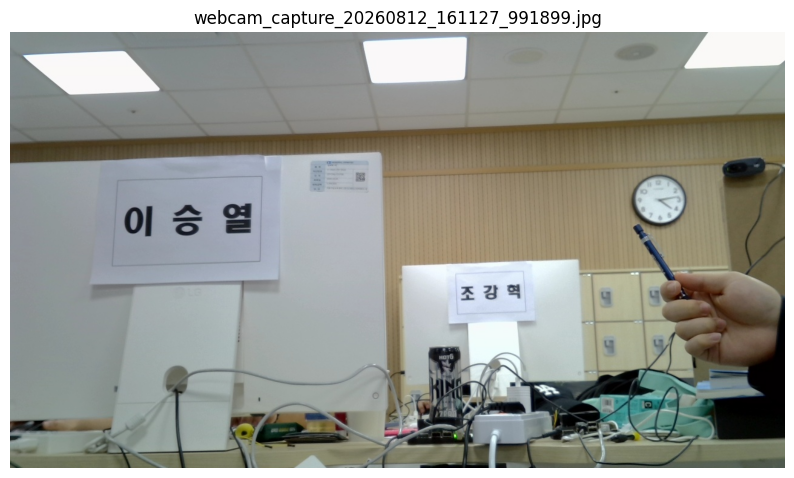

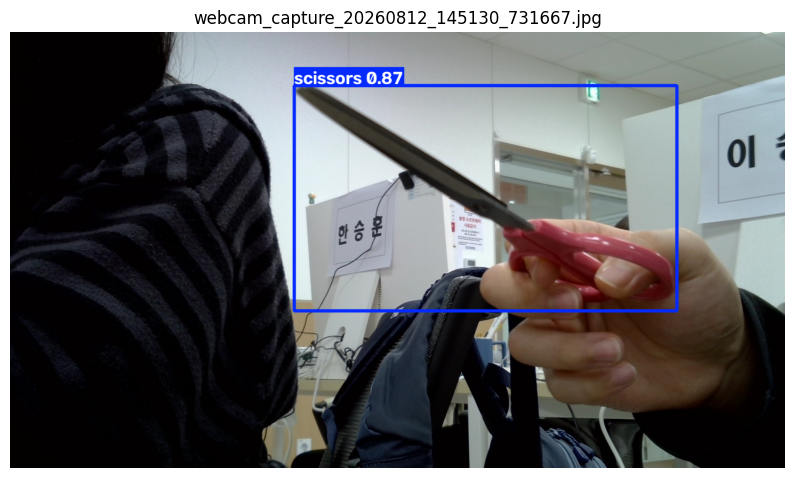

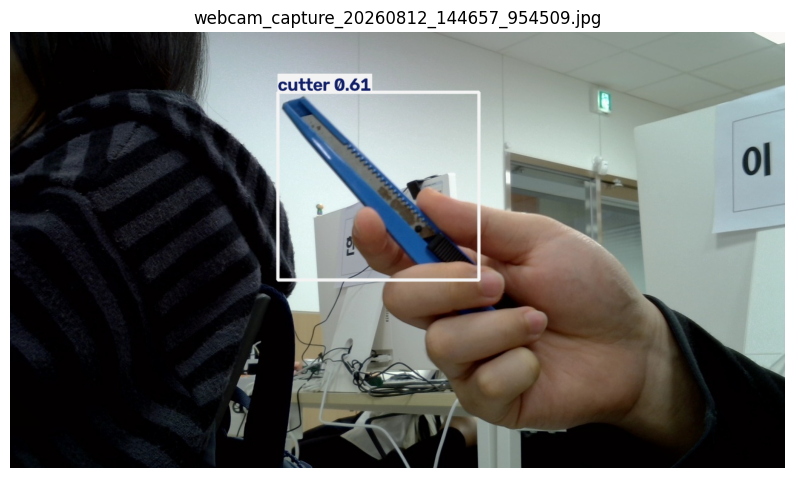

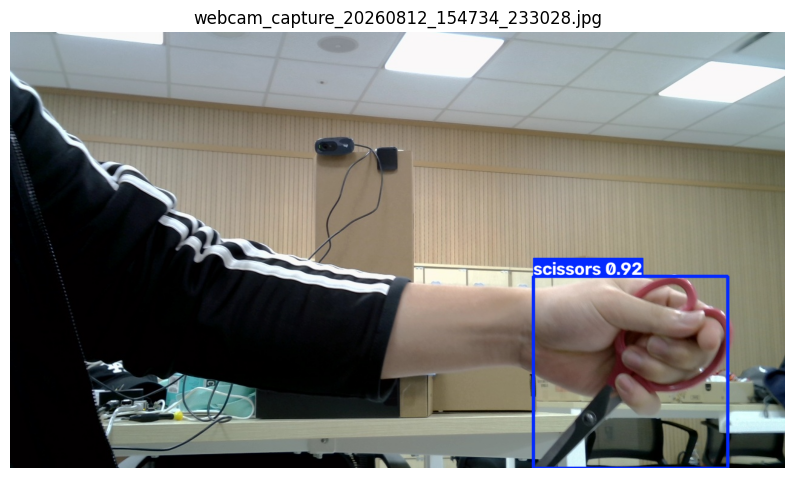

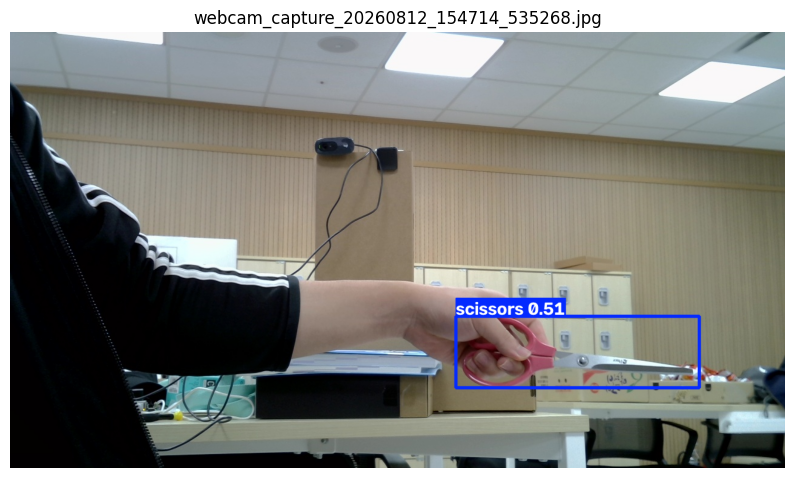

...

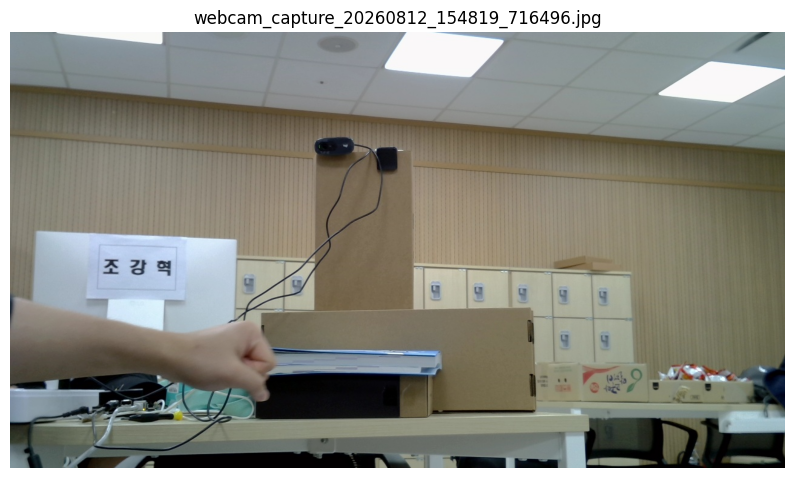

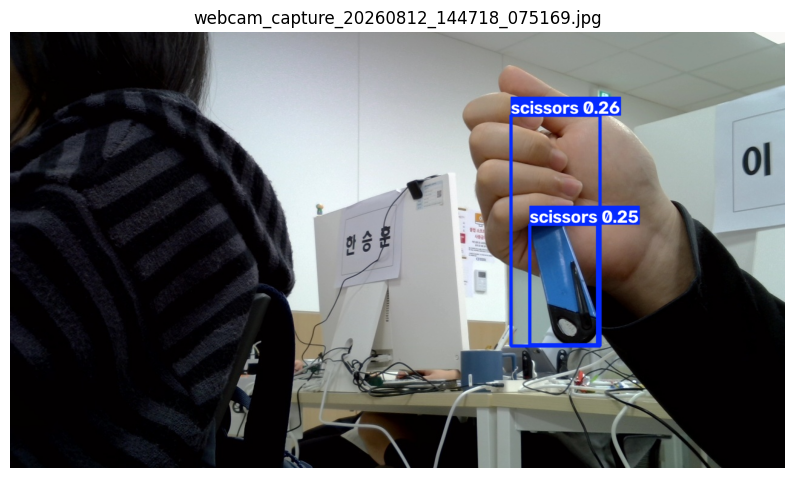

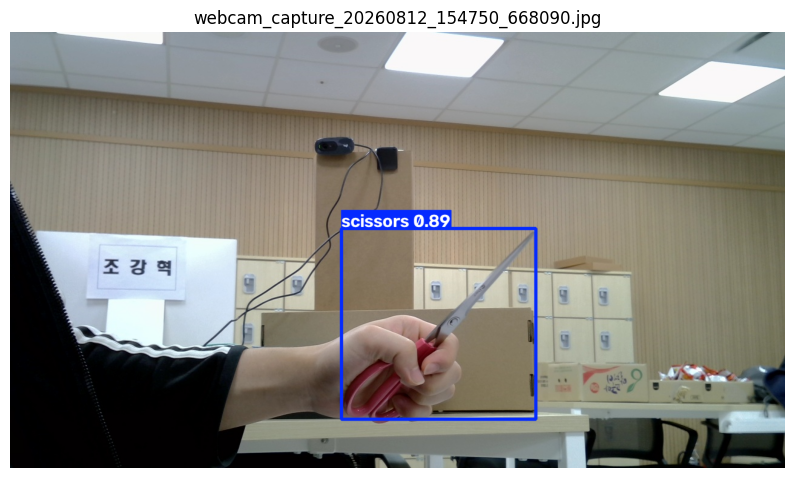

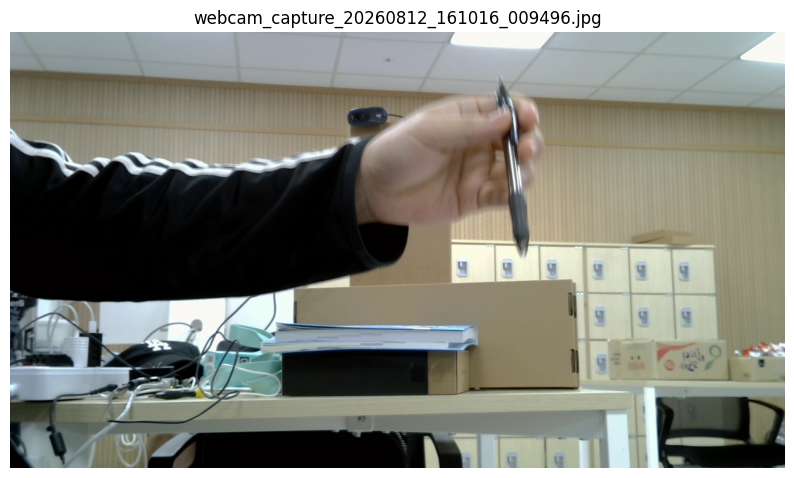

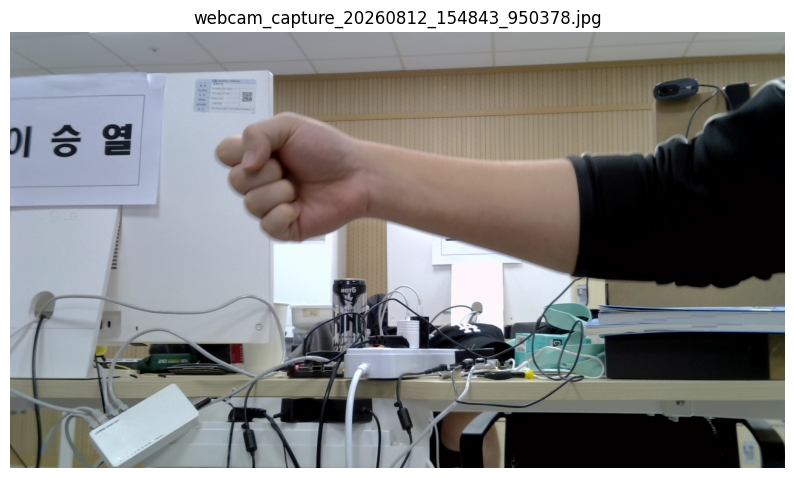

In [57]:
import random
import matplotlib.pyplot as plt

WEBCAM_VAL_DIR = C270_DATASET_ROOT / "images/val"

webcam_val_images = sorted([
    p for p in WEBCAM_VAL_DIR.iterdir()
    if (
        p.name.startswith("webcam_")
        and p.suffix.lower() in IMAGE_EXTS
    )
])

print("Webcam Val 이미지:", len(webcam_val_images))

random.seed(42)

samples = random.sample(
    webcam_val_images,
    min(12, len(webcam_val_images))
)

for img_path in samples:
    results = model_c270_best.predict(
        source=str(img_path),
        imgsz=640,
        conf=0.25,
        iou=0.5,
        device=0,
        verbose=False,
    )

    annotated = results[0].plot()

    plt.figure(figsize=(10, 7))
    plt.imshow(annotated[..., ::-1])
    plt.title(img_path.name)
    plt.axis("off")
    plt.show()

<h3 style="color:#FFD866; border-left:5px solid #FFD866; padding-left:12px;">
29. V2 / C270 Fine-tune v1 동일 Test 이미지 추론 비교
</h3>

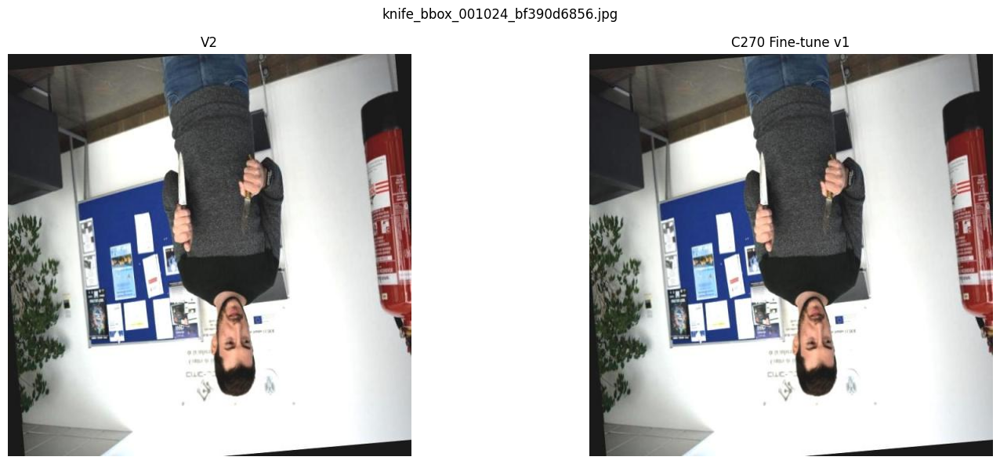

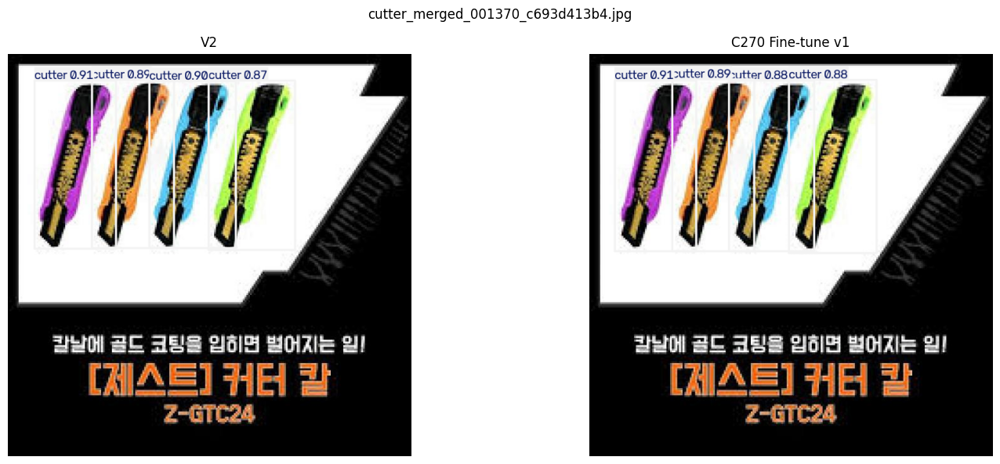

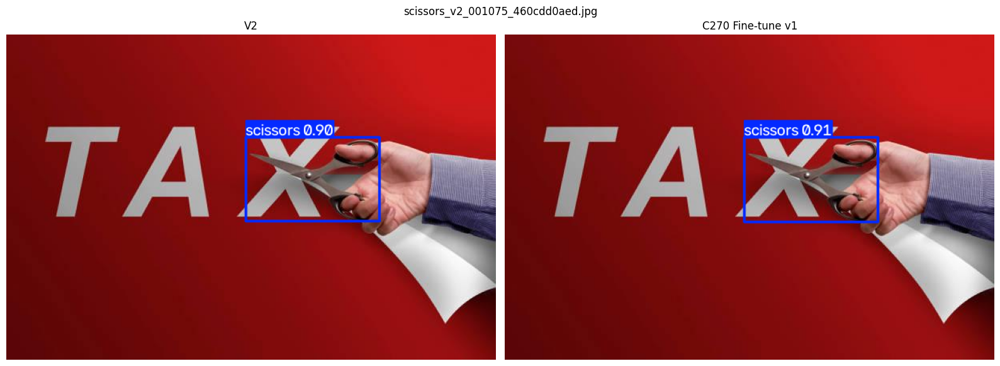

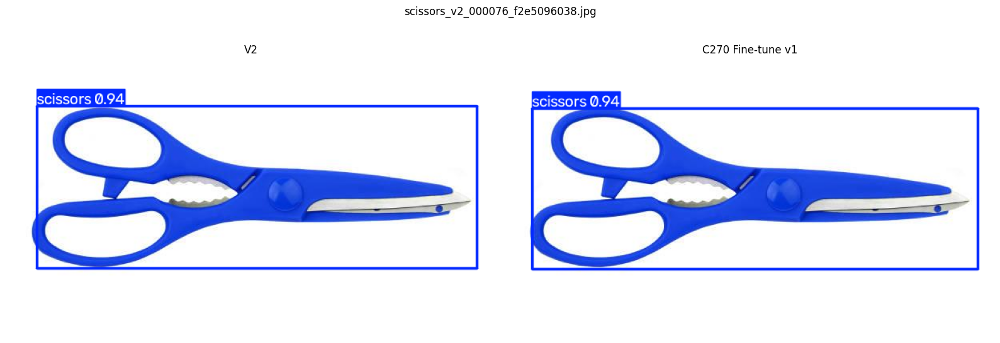

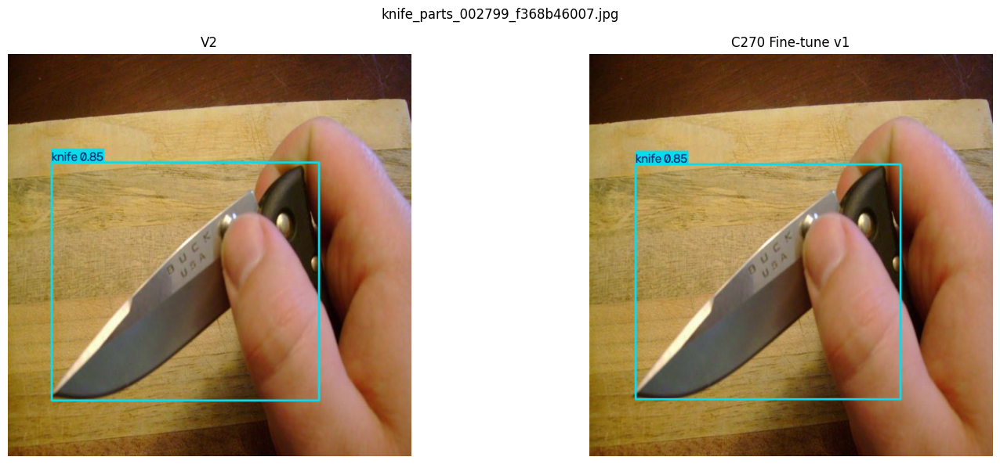

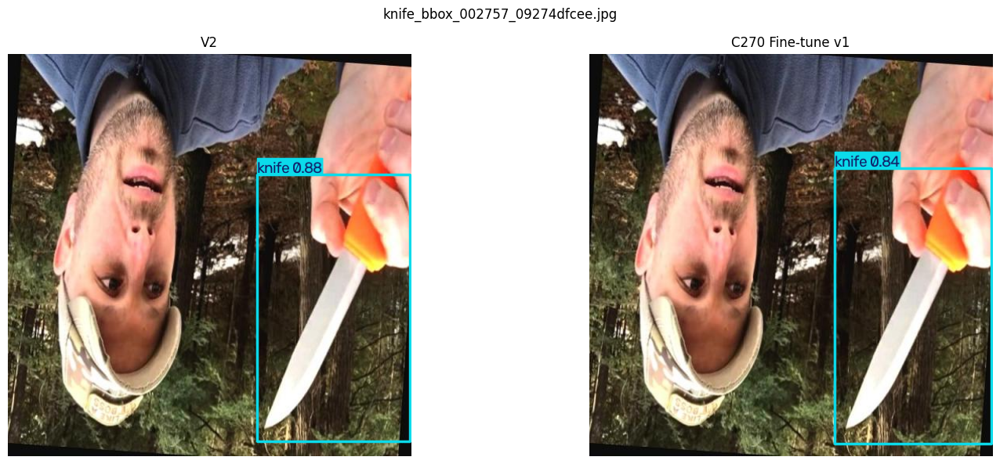

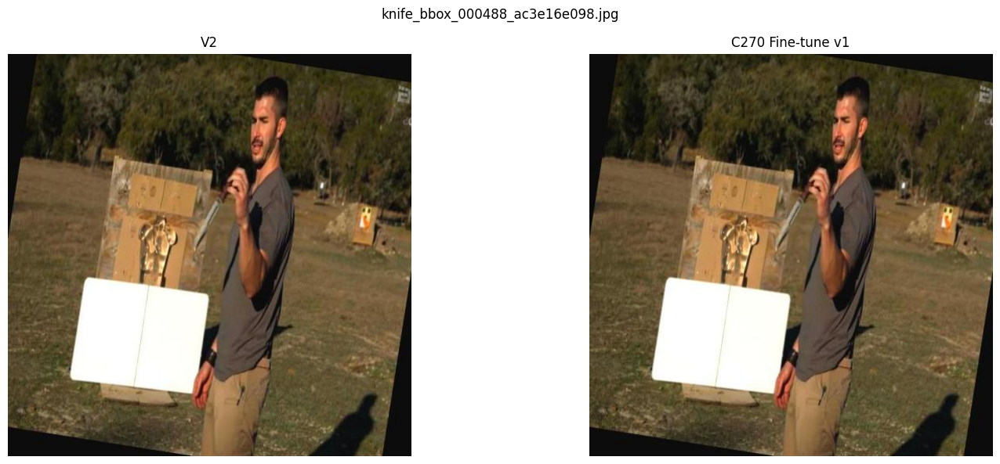

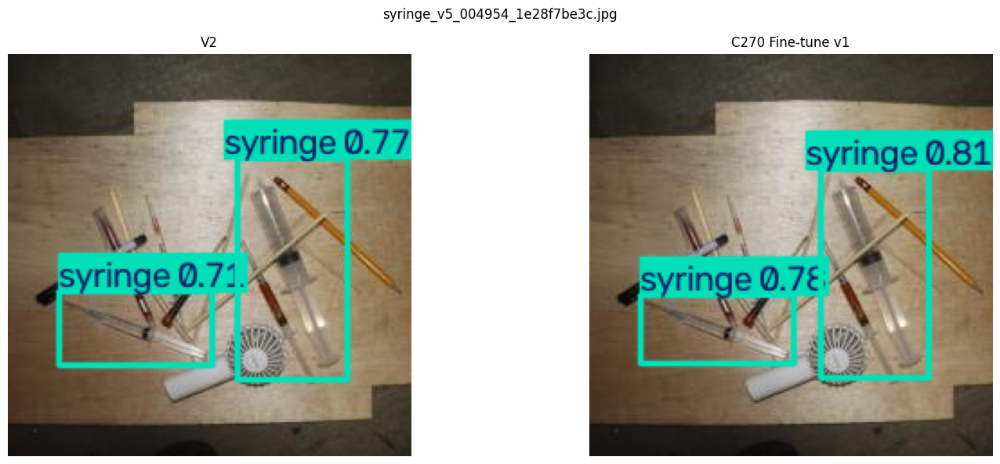

In [58]:
TEST_DIR = C270_DATASET_ROOT / "images/test"

test_images = sorted([
    p for p in TEST_DIR.iterdir()
    if p.suffix.lower() in IMAGE_EXTS
])

random.seed(42)

samples = random.sample(
    test_images,
    min(8, len(test_images))
)

for img_path in samples:
    result_v2 = model_v2.predict(
        source=str(img_path),
        imgsz=640,
        conf=0.35,
        iou=0.5,
        device=0,
        verbose=False,
    )[0].plot()

    result_c270 = model_c270_best.predict(
        source=str(img_path),
        imgsz=640,
        conf=0.35,
        iou=0.5,
        device=0,
        verbose=False,
    )[0].plot()

    fig, axes = plt.subplots(
        1,
        2,
        figsize=(16, 6)
    )

    axes[0].imshow(result_v2[..., ::-1])
    axes[0].set_title("V2")
    axes[0].axis("off")

    axes[1].imshow(result_c270[..., ::-1])
    axes[1].set_title("C270 Fine-tune v1")
    axes[1].axis("off")

    fig.suptitle(img_path.name)

    plt.tight_layout()
    plt.show()

<h3 style="color:#FFD866; border-left:5px solid #FFD866; padding-left:12px;">
30. 최종 모델 경로 확인
</h3>

In [59]:
print("최종 후보 모델")
print(BEST_C270)
print()
print("존재:", BEST_C270.exists())

print()
print(
    "Jetson에서는 이 best.pt를 복사한 뒤 "
    "실제 C270 웹캠으로 다시 확인합니다."
)

최종 후보 모델
/content/drive/MyDrive/AI_Project/wardy/ml/src/export/hazard_objects_c270_finetune_v1/weights/best.pt

존재: True

Jetson에서는 이 best.pt를 복사한 뒤 실제 C270 웹캠으로 다시 확인합니다.
